In [1]:
import cv2 as cv
from skimage import filters, feature
import numpy as np
from matplotlib import pyplot as plt
from glob import glob
# TODO: SVM, 
# Gwyddion

# Preparing data

In [2]:
img_list = []
paths = glob('./img/*')
for p in paths:
    img = cv.imread(p+'/10.jpg', 1)
    # img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    lab= cv.cvtColor(img, cv.COLOR_BGR2LAB)
    l_channel, a, b = cv.split(lab)
    
    # Applying CLAHE to L-channel
    # feel free to try different values for the limit and grid size:
    clahe = cv.createCLAHE(clipLimit=3.0, tileGridSize=(5,5))
    cl = clahe.apply(l_channel)
    
    # merge the CLAHE enhanced L-channel with the a and b channel
    limg = cv.merge((cl,a,b))
    
    # Converting image from LAB Color model to BGR color spcae
    result = cv.cvtColor(limg, cv.COLOR_LAB2BGR)
    result = cv.cvtColor(result, cv.COLOR_BGR2GRAY)
    img_list.append(result)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,10))
    ax1.imshow(img)
    ax2.imshow(result, cmap='grey')

# Some research about Canny 

Low threshold = 39.0; High threshold = 174.0;
 Mean = 104.69645690917969; Median = 89.0;


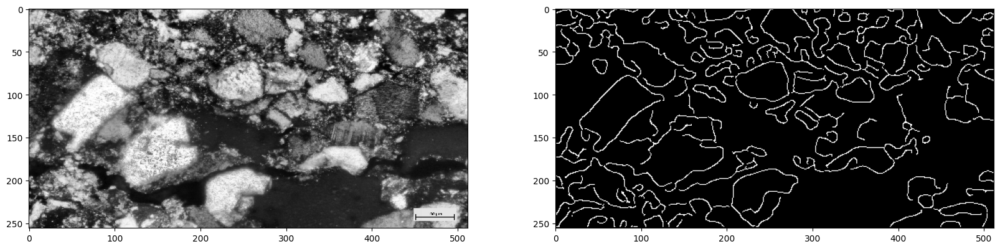

In [3]:
for img in img_list[:1]:
    # dst = cv.fastNlMeansDenoising(img,dst=None,templateWindowSize=7,searchWindowSize=21, h=20)
    # result = np.hstack((img, dst))
    
    img = cv.resize(img, (512, 256))
    # dst = cv.GaussianBlur(img, (9,9), 3)
    dst = img
    # sobel = filters.sobel(dst)
    
    mean = np.mean(dst)
    q = 0.2
    low = np.quantile(dst, q)
    high = np.quantile(dst, 1-q)
    print(f'Low threshold = {low}; High threshold = {high};\n Mean = {mean}; Median = {np.median(dst)};')
    canny = feature.canny(dst,
                          use_quantiles=True,
                          low_threshold=q, 
                          high_threshold=1-q,
                          sigma=3)
    # canny = cv.Canny(dst, low, high, apertureSize=3)
    # contours, hierarchy = cv.findContours(image=img, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_NONE)
    
    # draw contours on the original image
    # image_copy = img.copy()
    # cv.drawContours(image=image_copy, contours=contours, contourIdx=-1, color=(255, 0, 0), thickness=2, lineType=cv.LINE_AA)
    # cv.imshow('countour image',image_copy)
    # cv.waitKey(10)
        
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img, cmap='grey')
    ax2.imshow(canny, cmap='grey')
    plt.show()

# Edge Detection function (Canny)

Low threshold = 40.0; High threshold = 175.0;
 Mean = 105.01539351851852; Median = 89.0;


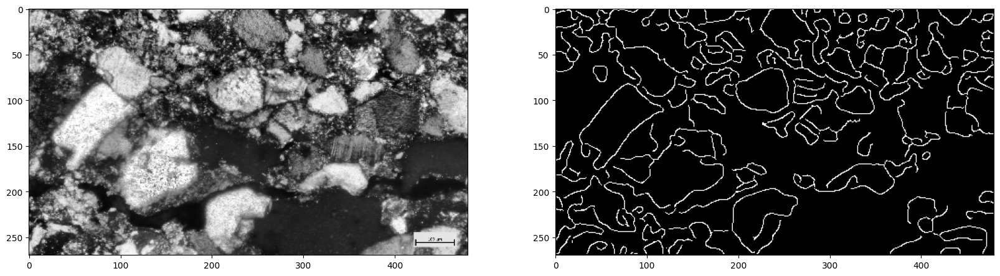

Low threshold = 42.0; High threshold = 152.0;
 Mean = 94.00925154320987; Median = 79.0;


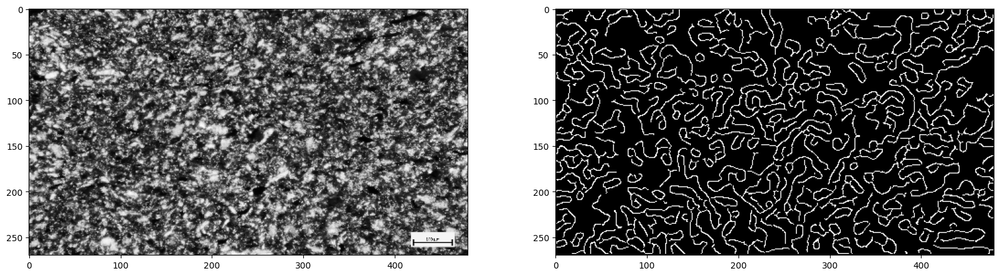

Low threshold = 37.0; High threshold = 161.0;
 Mean = 97.3766512345679; Median = 81.0;


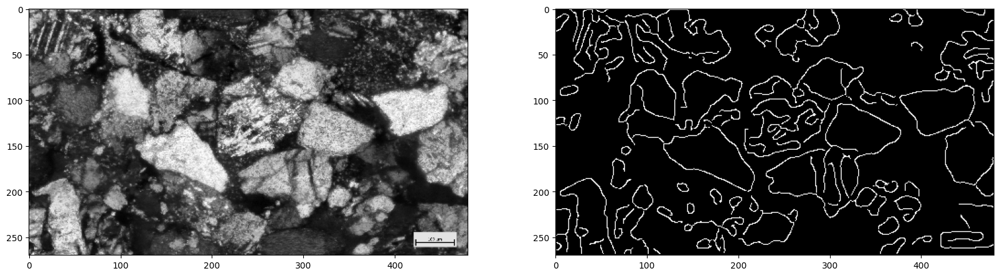

Low threshold = 39.0; High threshold = 174.0;
 Mean = 105.13675154320988; Median = 91.0;


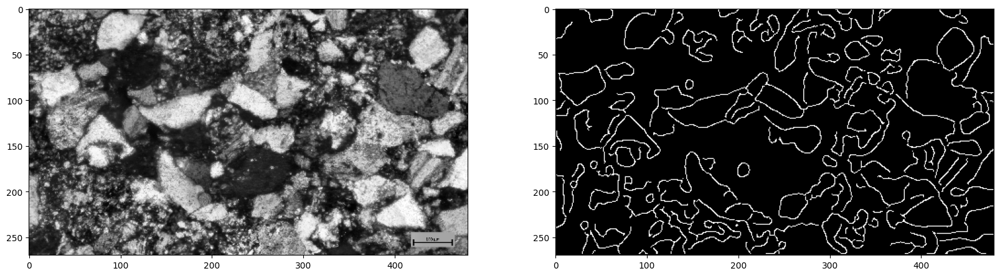

In [4]:
def worms(img, shrinkage=8, q=0.2, sigma=3, plot=False):
    h, w = np.shape(img)
    img = cv.resize(img, (int(w // shrinkage), int(h) // shrinkage))    
   
    low = np.quantile(img, q)
    high = np.quantile(img, 1-q)
    canny = feature.canny(img,
                          use_quantiles=True,
                          low_threshold=q, 
                          high_threshold=1-q,
                          sigma=sigma)
        
    if plot:
        mean = np.mean(img)
        print(f'Low threshold = {low}; High threshold = {high};\n Mean = {mean}; Median = {np.median(img)};')
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img, cmap='grey')
        ax2.imshow(canny, cmap='grey')
        plt.show()
    else:
        return dst
    
    
for image in img_list:
    worms(image,
          shrinkage=8,
          sigma=3,
          q=0.2,
          plot=True)

# Binarisation

threshold = 150.6 (coef = 0.6, max = 251.0)


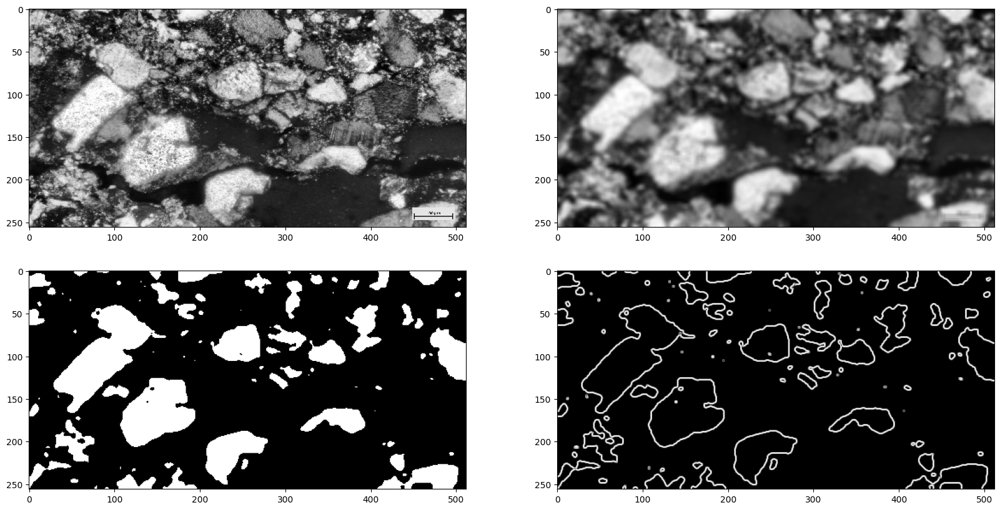

threshold = 138.6 (coef = 0.6, max = 231.0)


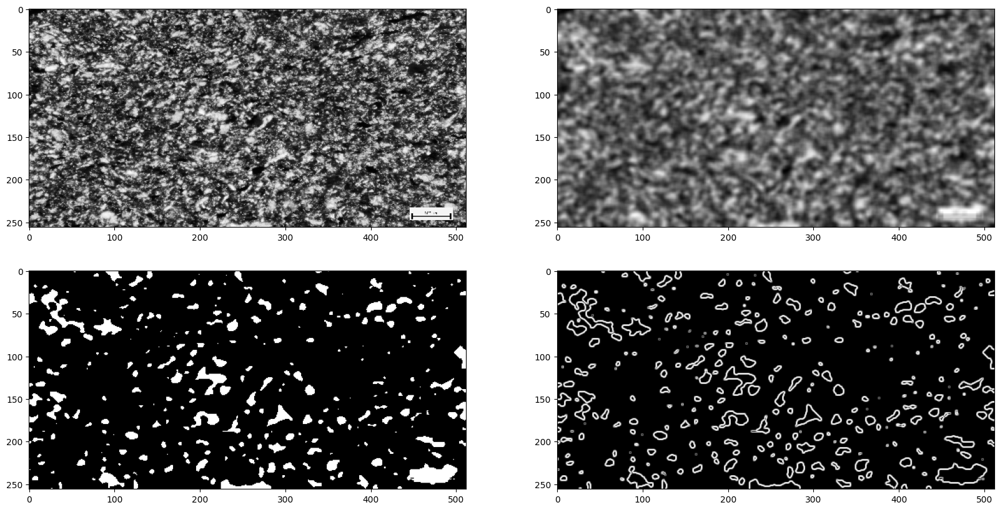

threshold = 142.79999999999998 (coef = 0.6, max = 237.99999999999997)


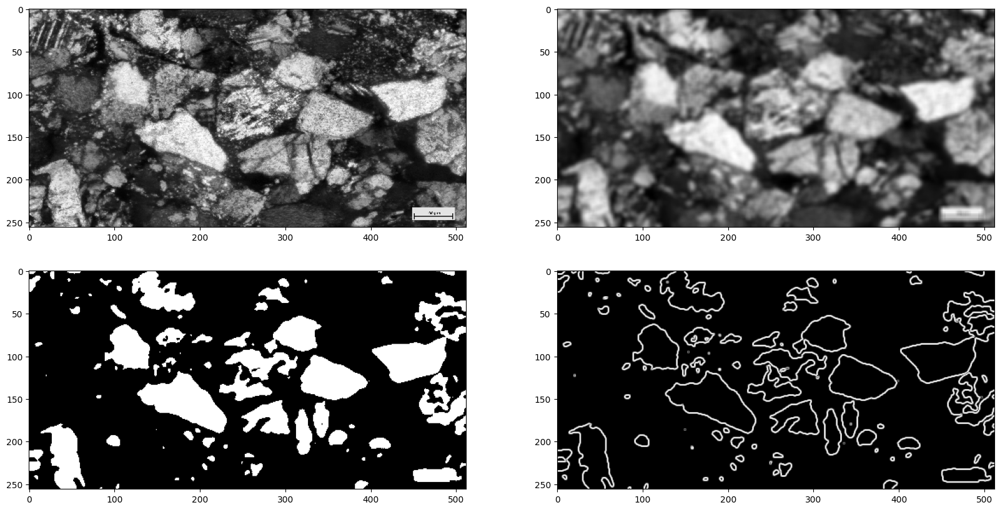

threshold = 148.79999999999998 (coef = 0.6, max = 247.99999999999997)


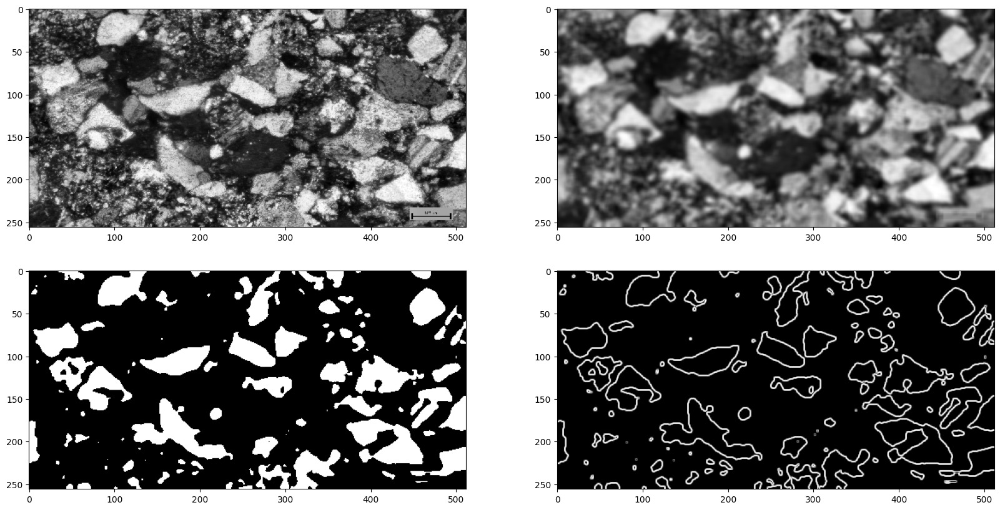

In [5]:
def thresholding(img, use='median', coef=1.0, binarise=True):
    tmp = img.copy()
    if use == 'mean':    
        threshold = coef * np.mean(img)
    elif use == 'max':
        threshold = coef * max(np.max(img), np.min(img))
    else:
        threshold = coef * np.median(img)
        
    print(f'threshold = {threshold} (coef = {coef}, {use} = {threshold / coef})')
    tmp[tmp <= threshold] = 0
    
    if binarise:
        tmp[tmp != 0] = 255
    return tmp
    
for img in img_list:
    img = cv.resize(img, (512, 256))
    blur = cv.GaussianBlur(img, (7,7), 3)
    binary = thresholding(blur, binarise=True, use='max', coef=0.6)
    res = filters.sobel(binary)

        
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20,10))
    ax1.imshow(img, cmap='grey')
    ax2.imshow(blur, cmap='grey')
    ax3.imshow(binary, cmap='grey')
    ax4.imshow(res, cmap='grey')
    plt.show()

threshold = 104.581748046875 (coef = 1.0, mean = 104.581748046875)


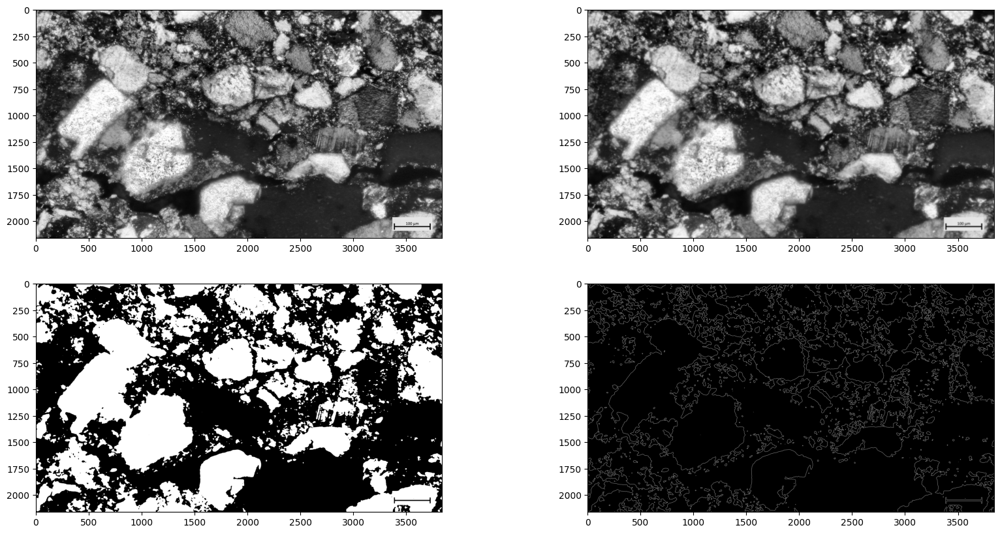

threshold = 93.54440791377314 (coef = 1.0, mean = 93.54440791377314)


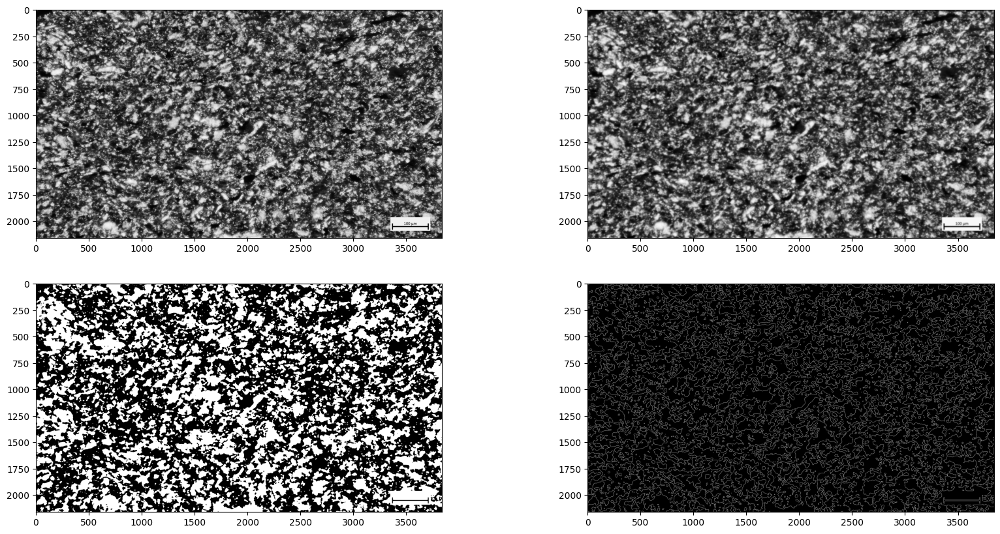

threshold = 96.91938717689044 (coef = 1.0, mean = 96.91938717689044)


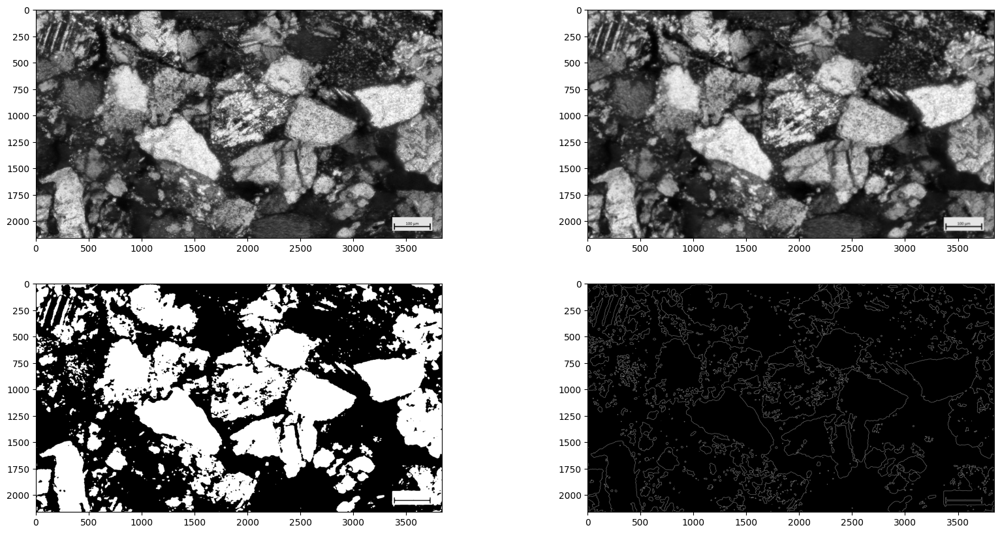

threshold = 104.67457875192902 (coef = 1.0, mean = 104.67457875192902)


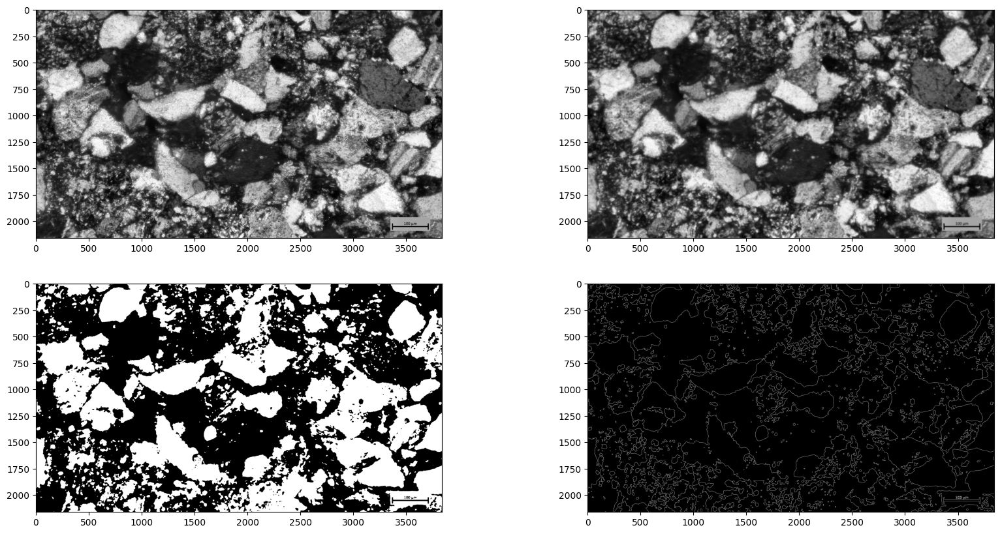

In [6]:
for img in img_list:
    # img = cv.resize(img, (512, 256))
    blur = cv.GaussianBlur(img, (51,51), 3)
    binary = thresholding(blur, binarise=True, use='mean', coef=1.0)
    res = filters.sobel(binary)

        
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20,10))
    ax1.imshow(img, cmap='grey')
    ax2.imshow(blur, cmap='grey')
    ax3.imshow(binary, cmap='grey')
    ax4.imshow(res, cmap='grey')
    plt.show()